# Image MAL

* Upload model inferences for image tasks (point, polygon, bounding box, segmentation, polyline)

In [1]:
!pip install labelbox
!pip install requests
!pip install ndjson
!pip install scikit-image
!pip install PILLOW
!pip install tensorflow
!pip install opencv-python

In [2]:
# Run these if running in a colab notebook
COLAB = "google.colab" in str(get_ipython())
if COLAB:
    !git clone https://github.com/Labelbox/labelbox-python.git
    !mv labelbox-python/examples/model_assisted_labeling/*.py .

In [3]:
# Used this as a reference for the model
# https://colab.research.google.com/github/tensorflow/tpu/blob/master/models/official/mask_rcnn/mask_rcnn_demo.ipynb#scrollTo=6lCL-ZcwaJbA
from labelbox.schema.ontology import OntologyBuilder, Tool, Classification, Option
from labelbox import Client, LabelingFrontend
from image_model import predict, class_mappings, load_model
from image_mal_utils import (visualize_bbox_ndjsons, visualize_poly_ndjsons,
                             visualize_point_ndjsons, visualize_mask_ndjsons)
from io import BytesIO
from typing import Dict, Any, Tuple
from getpass import getpass
import uuid
import numpy as np
from PIL import Image
import requests
from google.cloud import storage
import datetime as dt
from skimage import measure
import ndjson
import os

In [4]:
# If you don't want to give google access to drive you can skip this cell
# and manually set `API_KEY` below.

if COLAB:
    !pip install colab-env -qU
    from colab_env import envvar_handler
    envvar_handler.envload()

API_KEY = os.environ.get("LABELBOX_API_KEY")
if not os.environ.get("LABELBOX_API_KEY"):
    API_KEY = getpass("Please enter your labelbox api key")
    if COLAB:
        envvar_handler.add_env("LABELBOX_API_KEY", API_KEY)

In [5]:
# Only update this if you have an on-prem deployment
ENDPOINT = "https://api.labelbox.com/graphql"

In [6]:
client = Client(api_key=API_KEY, endpoint=ENDPOINT)

In [7]:
# Downloads weights and loads the model.
load_model()

Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.loader.load or tf.compat.v1.saved_model.load. There will be a new function for importing SavedModels in Tensorflow 2.0.
INFO:tensorflow:Restoring parameters from gs://cloud-tpu-checkpoints/mask-rcnn/1555659850/variables/variables


### Project Setup

In [8]:
# We want to try out a few different tools here.
ontology_builder = OntologyBuilder(tools=[
    Tool(tool=Tool.Type.BBOX, name="person"),
    Tool(tool=Tool.Type.POLYGON, name="umbrella"),
    Tool(tool=Tool.Type.SEGMENTATION, name="car"),
    Tool(tool=Tool.Type.POINT, name="handbag"),
])

In [9]:
# Lets setup a project to label
# Note see Ontology, Project, and Project_setup notebooks for more information on this section.
project = client.create_project(name="image_mal_project")
dataset = client.create_dataset(name="image_mal_dataset")
test_img_url = "https://raw.githubusercontent.com/Labelbox/labelbox-python/sdk/examples/assets/2560px-Kitano_Street_Kobe01s5s4110.jpg"
dataset.create_data_row(row_data=test_img_url)
editor = next(
    client.get_labeling_frontends(where=LabelingFrontend.name == "Editor"))
project.setup(editor, ontology_builder.asdict())
project.datasets.connect(dataset)

In [10]:
project.enable_model_assisted_labeling()

True

#### Grab featureSchemaIds

In [11]:
# When we created a project with the ontology defined above, all of the ids were assigned.
# So lets reconstruct the ontology builder with all of the ids.
ontology = ontology_builder.from_project(project)
# We want all of the feature schemas to be easily accessible by name.
schema_lookup = {tool.name: tool.feature_schema_id for tool in ontology.tools}
print(schema_lookup)

{'person': 'ckmuyjqbk61c90y7o6iu106jv', 'umbrella': 'ckmuyjqbl61cb0y7odg5n9mmm', 'car': 'ckmuyjqbl61cd0y7o0l5jg5o3', 'handbag': 'ckmuyjqbm61cf0y7o7b3icgmi'}


### Create import objects
* We want to create a json payload that matches this: https://docs.labelbox.com/data-model/en/index-en#annotations
* Here we will run inferences on all of our data (only one image this time)

##### Create helper functions to make this much easier

In [12]:
def create_boxes_ndjson(datarow_id: str, schema_id: str, t: float, l: float,
                        b: float, r: float) -> Dict[str, Any]:
    """
    * https://docs.labelbox.com/data-model/en/index-en#bounding-box
    
    Args:
        datarow_id (str): id of the data_row (in this case image) to add this annotation to
        schema_id (str): id of the bbox tool in the current ontology
        t, l, b, r (int): top, left, bottom, right pixel coordinates of the bbox
    Returns:
        ndjson representation of a bounding box
    """
    return {
        "uuid": str(uuid.uuid4()),
        "schemaId": schema_id,
        "dataRow": {
            "id": datarow_id
        },
        "bbox": {
            "top": int(t),
            "left": int(l),
            "height": int(b - t),
            "width": int(r - l)
        }
    }


def create_polygon_ndjson(datarow_id: str, schema_id: str,
                          seg: np.ndarray) -> Dict[str, Any]:
    """
    * https://docs.labelbox.com/data-model/en/index-en#polygon
    
    Args:
        datarow_id (str): id of the data_row (in this case image) to add this annotation to
        schema_id (str): id of the bbox tool in the current ontology
        seg (np.ndarray): Segmentation mask of size (image_h, image_w)
            - Seg mask is turned into a polygon since polygons aren't directly inferred.
    Returns:
        ndjson representation of a polygon
    """
    contours = measure.find_contours(seg, 0.5)
    #Note that complex polygons could break.
    pts = contours[0].astype(np.int32)
    pts = np.roll(pts, 1, axis=-1)
    pts = [{'x': int(x), 'y': int(y)} for x, y in pts]
    return {
        "uuid": str(uuid.uuid4()),
        "schemaId": schema_id,
        "dataRow": {
            "id": datarow_id
        },
        "polygon": pts
    }


def create_mask_ndjson(client: Client, datarow_id: str, schema_id: str,
                       seg: np.ndarray, color: Tuple[int, int,
                                                     int]) -> Dict[str, Any]:
    """
    Creates a mask for each object in the image
    * https://docs.labelbox.com/data-model/en/index-en#segmentation-mask
    
    Args:
        client (labelbox.Client): labelbox client used for uploading seg mask to google cloud storage
        datarow_id (str): id of the data_row (in this case image) to add this annotation to
        schema_id (str): id of the segmentation tool in the current ontology
        seg is a seg mask of size (image_h, image_w)
        color ( Tuple[int,int,int]): rgb color to convert binary mask into 3D colorized mask
    Return:
        ndjson representation of a segmentation mask 
    """

    colorize = np.concatenate(([seg[..., np.newaxis] * c for c in color]),
                              axis=2)
    img_bytes = BytesIO()
    Image.fromarray(colorize).save(img_bytes, format="PNG")
    #* Use your own signed urls so that you can resign the data
    #* This is just to make the demo work
    url = client.upload_data(content=img_bytes.getvalue(), sign=True)
    return {
        "uuid": str(uuid.uuid4()),
        "schemaId": schema_id,
        "dataRow": {
            "id": datarow_id
        },
        "mask": {
            "instanceURI": url,
            "colorRGB": color
        }
    }
    return result


def create_point_ndjson(datarow_id: str, schema_id: str, t: float, l: float,
                        b: float, r: float) -> Dict[str, Any]:
    """
    * https://docs.labelbox.com/data-model/en/index-en#point
    
    Args:
        datarow_id (str): id of the data_row (in this case image) to add this annotation to
        schema_id (str): id of the point tool in the current ontology
        t, l, b, r (int): top, left, bottom, right pixel coordinates of the bbox
        - The model doesn't directly predict points, so we grab the centroid of the predicted bounding box
    Returns:
        ndjson representation of a polygon        
    """
    return {
        "uuid": str(uuid.uuid4()),
        "schemaId": schema_id,
        "dataRow": {
            "id": datarow_id
        },
        "point": {
            "x": int((l + r) / 2.),
            "y": int((t + b) / 2.),
        }
    }

* Loop over data_rows, make predictions, and create ndjson

In [13]:
nd_box_payloads = []
nd_mask_payloads = []
nd_poly_payloads = []
nd_point_payloads = []

for data_row in dataset.data_rows():
    np_image_bytes = np.array([requests.get(data_row.row_data).content])
    w, h = Image.open(BytesIO(np_image_bytes[0])).size
    prediction = predict(np_image_bytes, min_score=0.5, height=h, width=w)

    boxes, classes, seg_masks = prediction["boxes"], prediction[
        "class_indices"], prediction["seg_masks"]
    for box, class_idx, seg in zip(boxes, classes, seg_masks):
        class_name = class_mappings[class_idx]
        schema_id = schema_lookup[class_name]
        if class_name == "other":
            continue
        elif class_name == "person":
            nd_box_payloads.append(
                create_boxes_ndjson(data_row.uid, schema_id, *box))
        elif class_name == "car":
            nd_mask_payloads.append(
                create_mask_ndjson(client, data_row.uid, schema_id, seg,
                                   (255, 0, 0)))
        elif class_name == "handbag":
            nd_point_payloads.append(
                create_point_ndjson(data_row.uid, schema_id, *box))
        elif class_name == "umbrella":
            nd_poly_payloads.append(
                create_polygon_ndjson(data_row.uid, schema_id, seg))

#### Visualize ndjson payloads to make sure everything worked

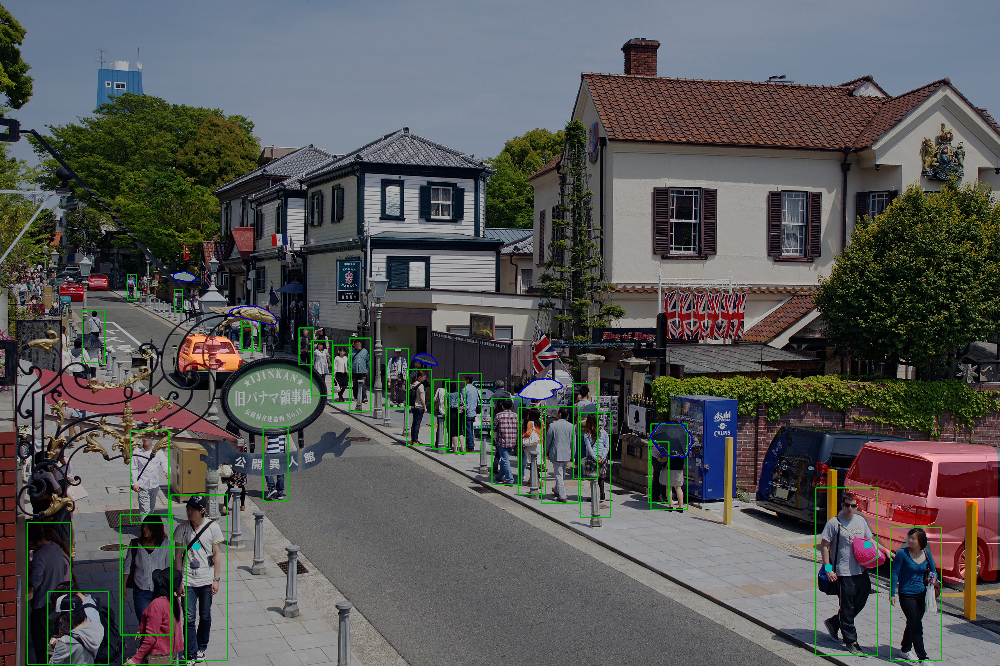

In [14]:
image = np.array(Image.open(BytesIO(np_image_bytes[0])))
image = visualize_bbox_ndjsons(image, nd_box_payloads, (0, 255, 0))
image = visualize_poly_ndjsons(image, nd_poly_payloads, (0, 0, 255))
image = visualize_point_ndjsons(image, nd_point_payloads, (0, 255, 255))
image = visualize_mask_ndjsons(image, nd_mask_payloads)
Image.fromarray(image)

### Upload the annotations

In [15]:
# Let's upload!
annotations = nd_box_payloads + nd_mask_payloads + nd_poly_payloads + nd_point_payloads
upload_task = project.upload_annotations(name=f"upload-job-{uuid.uuid4()}",
                                         annotations=annotations,
                                         validate=True)

In [16]:
# Wait for upload to finish (Will take up to five minutes)
upload_task.wait_until_done()
# Review the upload status
print(upload_task.errors)

[]


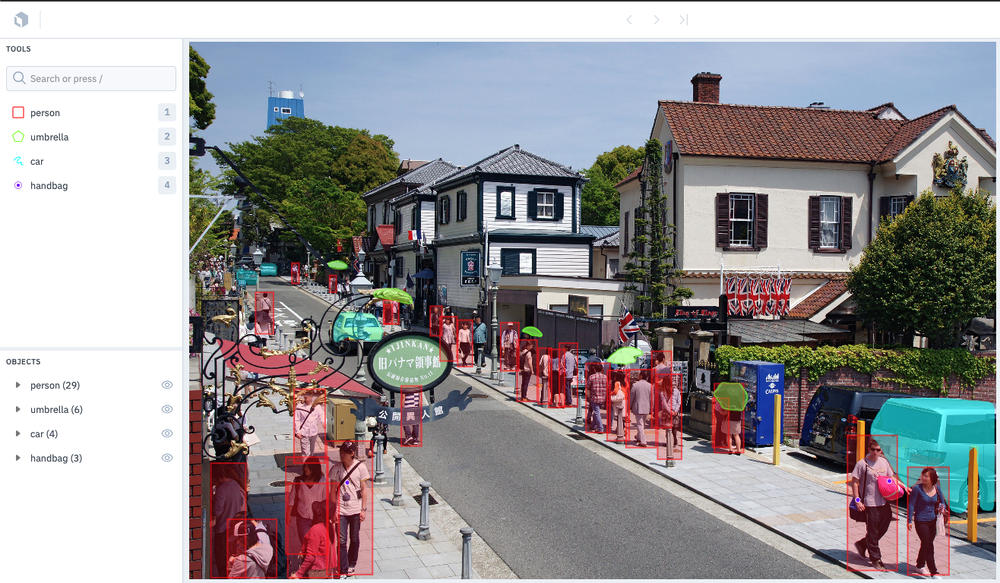